In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import networkx as nx
import scipy as sc
from scipy.spatial import Delaunay
from scipy.spatial.distance import cdist
import random

import pickle

from simplicial_kuramoto import SimplicialComplex
from simplicial_kuramoto.graph_generator import modular_graph
from simplicial_kuramoto.integrators import *
from simplicial_kuramoto.plotting import *

from simplicial_kuramoto.frustration_scan import *

In [3]:
def is_in_subspace(vector,matrix):
    ns=sc.linalg.null_space(matrix.todense())
    
    coeff=vector.dot(ns)
    ns_dim=coeff.shape
    
    vector_hat=np.zeros(ns.shape[0])

    for i in range(ns.shape[1]):
        vector_hat+=coeff[i]*ns[:,i]
    
    error=np.sum(np.abs(vector-vector_hat))
    
    return error, vector_hat, coeff, ns_dim

## One hole square

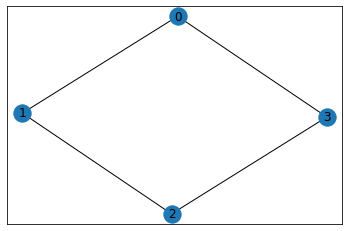

In [4]:
G=nx.Graph()

G.add_edge(0,1,weight=1,edge_com=0)
G.add_edge(1,2,weight=1,edge_com=0)
G.add_edge(2,3,weight=1,edge_com=0)
G.add_edge(3,0,weight=1,edge_com=0)

node_com_dict=dict(zip(list(np.linspace(0,3,4).astype(int)),[0,0,0,0]))
nx.set_node_attributes(G, node_com_dict, "node_com")

edge_community_assignment=np.array(list(nx.get_edge_attributes(G,'edge_com').values()))

Gsc=SimplicialComplex(graph=G, no_faces=False)

plt.figure()
nx.draw_networkx(G)
plt.show()

In [5]:
Gsc.edgelist

[(0, 1), (0, 3), (1, 2), (2, 3)]

In [6]:
alpha1 = np.linspace(0,np.pi, 10)
alpha2 = np.linspace(0, np.pi, 10)
n_repeats = 1

scan_frustration_parameters(
        Gsc,
        filename="square.pkl",
        alpha1=alpha1,
        alpha2=alpha2,
        repeats=n_repeats,
        n_workers=2,
    )

100%|██████████| 100/100 [05:25<00:00,  3.25s/it]


[[  message: 'The solver successfully reached the end of the integration interval.'
       nfev: 534
       njev: 2
        nlu: 37
        sol: None
     status: 0
    success: True
          t: array([  0.        ,   0.1001001 ,   0.2002002 ,   0.3003003 ,
           0.4004004 ,   0.5005005 ,   0.6006006 ,   0.7007007 ,
           0.8008008 ,   0.9009009 ,   1.001001  ,   1.1011011 ,
           1.2012012 ,   1.3013013 ,   1.4014014 ,   1.5015015 ,
           1.6016016 ,   1.7017017 ,   1.8018018 ,   1.9019019 ,
           2.002002  ,   2.1021021 ,   2.2022022 ,   2.3023023 ,
           2.4024024 ,   2.5025025 ,   2.6026026 ,   2.7027027 ,
           2.8028028 ,   2.9029029 ,   3.003003  ,   3.1031031 ,
           3.2032032 ,   3.3033033 ,   3.4034034 ,   3.5035035 ,
           3.6036036 ,   3.7037037 ,   3.8038038 ,   3.9039039 ,
           4.004004  ,   4.1041041 ,   4.2042042 ,   4.3043043 ,
           4.4044044 ,   4.5045045 ,   4.6046046 ,   4.7047047 ,
           4.8048048 ,   4

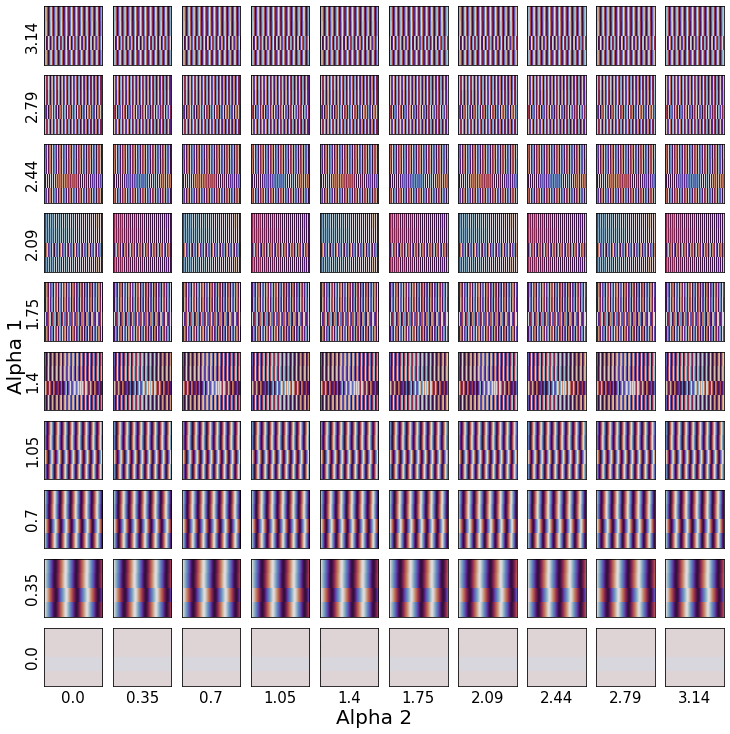

In [7]:
folder = "./results/"

path = folder + "square.pkl"
filename = "square.pdf"
plot_phases(path, filename)

In [8]:
Gsc.flip_edge_orientation(3)

alpha1 = np.linspace(0,np.pi, 10)
alpha2 = np.linspace(0, np.pi, 10)
n_repeats = 1

scan_frustration_parameters(
        Gsc,
        filename="square_flip.pkl",
        alpha1=alpha1,
        alpha2=alpha2,
        repeats=n_repeats,
        n_workers=2,
    )

100%|██████████| 100/100 [05:38<00:00,  3.38s/it]


[[  message: 'The solver successfully reached the end of the integration interval.'
       nfev: 491
       njev: 2
        nlu: 35
        sol: None
     status: 0
    success: True
          t: array([  0.        ,   0.1001001 ,   0.2002002 ,   0.3003003 ,
           0.4004004 ,   0.5005005 ,   0.6006006 ,   0.7007007 ,
           0.8008008 ,   0.9009009 ,   1.001001  ,   1.1011011 ,
           1.2012012 ,   1.3013013 ,   1.4014014 ,   1.5015015 ,
           1.6016016 ,   1.7017017 ,   1.8018018 ,   1.9019019 ,
           2.002002  ,   2.1021021 ,   2.2022022 ,   2.3023023 ,
           2.4024024 ,   2.5025025 ,   2.6026026 ,   2.7027027 ,
           2.8028028 ,   2.9029029 ,   3.003003  ,   3.1031031 ,
           3.2032032 ,   3.3033033 ,   3.4034034 ,   3.5035035 ,
           3.6036036 ,   3.7037037 ,   3.8038038 ,   3.9039039 ,
           4.004004  ,   4.1041041 ,   4.2042042 ,   4.3043043 ,
           4.4044044 ,   4.5045045 ,   4.6046046 ,   4.7047047 ,
           4.8048048 ,   4

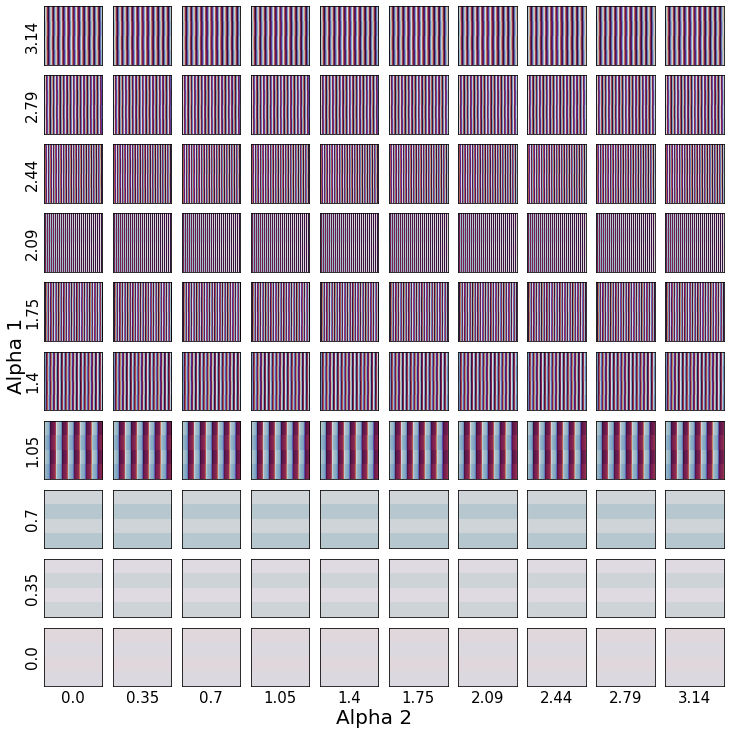

In [9]:
folder = "./results/"

path = folder + "square_flip.pkl"
filename = "square_flip.pdf"
plot_phases(path, filename)

## Hexagone

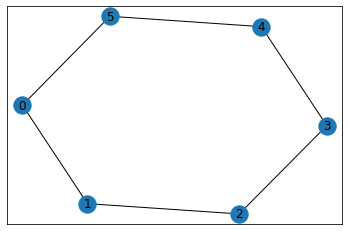

In [10]:
G=nx.Graph()

G.add_edge(0,1,weight=1,edge_com=0)
G.add_edge(1,2,weight=1,edge_com=1)
G.add_edge(2,3,weight=1,edge_com=2)
G.add_edge(3,4,weight=1,edge_com=0)
G.add_edge(4,5,weight=1,edge_com=1)
G.add_edge(5,0,weight=1,edge_com=2)

node_com_dict=dict(zip(list(np.linspace(0,5,6).astype(int)),[0,0,0,0,0,0]))
nx.set_node_attributes(G, node_com_dict, "node_com")

edge_community_assignment=np.array(list(nx.get_edge_attributes(G,'edge_com').values()))

Gsc=SimplicialComplex(graph=G, no_faces=False)

plt.figure()
nx.draw_networkx(G)
plt.show()

In [11]:
Gsc.edgelist

[(0, 1), (0, 5), (1, 2), (2, 3), (3, 4), (4, 5)]

In [12]:
alpha1 = np.linspace(0,np.pi, 10)
alpha2 = np.linspace(0, np.pi, 10)
n_repeats = 1

scan_frustration_parameters(
        Gsc,
        filename="hexagone.pkl",
        alpha1=alpha1,
        alpha2=alpha2,
        repeats=n_repeats,
        n_workers=2,
    )

100%|██████████| 100/100 [05:26<00:00,  3.27s/it]


[[  message: 'The solver successfully reached the end of the integration interval.'
       nfev: 592
       njev: 2
        nlu: 41
        sol: None
     status: 0
    success: True
          t: array([  0.        ,   0.1001001 ,   0.2002002 ,   0.3003003 ,
           0.4004004 ,   0.5005005 ,   0.6006006 ,   0.7007007 ,
           0.8008008 ,   0.9009009 ,   1.001001  ,   1.1011011 ,
           1.2012012 ,   1.3013013 ,   1.4014014 ,   1.5015015 ,
           1.6016016 ,   1.7017017 ,   1.8018018 ,   1.9019019 ,
           2.002002  ,   2.1021021 ,   2.2022022 ,   2.3023023 ,
           2.4024024 ,   2.5025025 ,   2.6026026 ,   2.7027027 ,
           2.8028028 ,   2.9029029 ,   3.003003  ,   3.1031031 ,
           3.2032032 ,   3.3033033 ,   3.4034034 ,   3.5035035 ,
           3.6036036 ,   3.7037037 ,   3.8038038 ,   3.9039039 ,
           4.004004  ,   4.1041041 ,   4.2042042 ,   4.3043043 ,
           4.4044044 ,   4.5045045 ,   4.6046046 ,   4.7047047 ,
           4.8048048 ,   4

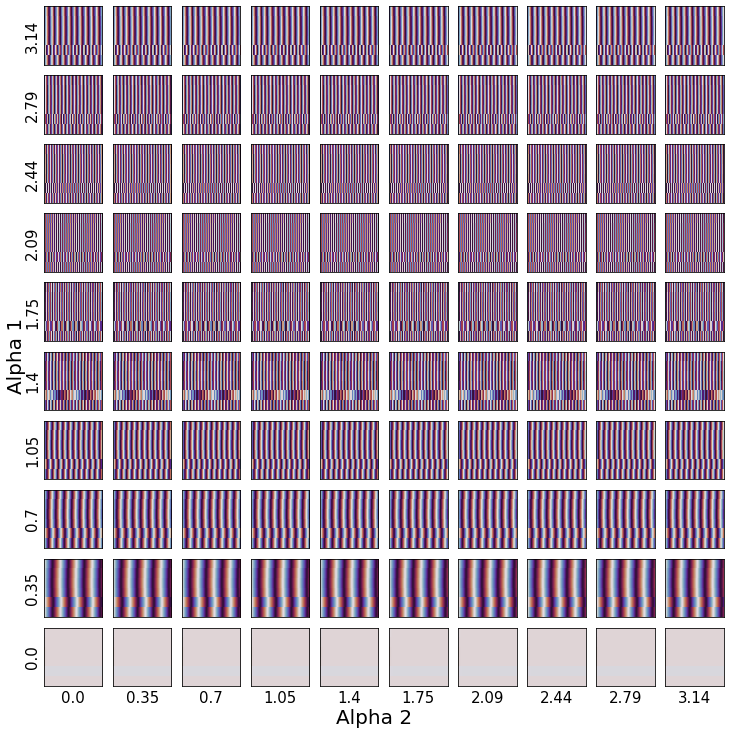

In [13]:
folder = "./results/"

path = folder + "hexagone.pkl"
filename = "hexagone.pdf"
plot_phases(path, filename)

In [14]:
Gsc.flip_edge_orientation(1)

alpha1 = np.linspace(0,np.pi, 10)
alpha2 = np.linspace(0, np.pi, 10)
n_repeats = 1

scan_frustration_parameters(
        Gsc,
        filename="hexagone_flip.pkl",
        alpha1=alpha1,
        alpha2=alpha2,
        repeats=n_repeats,
        n_workers=2,
    )

100%|██████████| 100/100 [00:19<00:00,  5.17it/s]


[[  message: 'The solver successfully reached the end of the integration interval.'
       nfev: 439
       njev: 2
        nlu: 35
        sol: None
     status: 0
    success: True
          t: array([  0.        ,   0.1001001 ,   0.2002002 ,   0.3003003 ,
           0.4004004 ,   0.5005005 ,   0.6006006 ,   0.7007007 ,
           0.8008008 ,   0.9009009 ,   1.001001  ,   1.1011011 ,
           1.2012012 ,   1.3013013 ,   1.4014014 ,   1.5015015 ,
           1.6016016 ,   1.7017017 ,   1.8018018 ,   1.9019019 ,
           2.002002  ,   2.1021021 ,   2.2022022 ,   2.3023023 ,
           2.4024024 ,   2.5025025 ,   2.6026026 ,   2.7027027 ,
           2.8028028 ,   2.9029029 ,   3.003003  ,   3.1031031 ,
           3.2032032 ,   3.3033033 ,   3.4034034 ,   3.5035035 ,
           3.6036036 ,   3.7037037 ,   3.8038038 ,   3.9039039 ,
           4.004004  ,   4.1041041 ,   4.2042042 ,   4.3043043 ,
           4.4044044 ,   4.5045045 ,   4.6046046 ,   4.7047047 ,
           4.8048048 ,   4

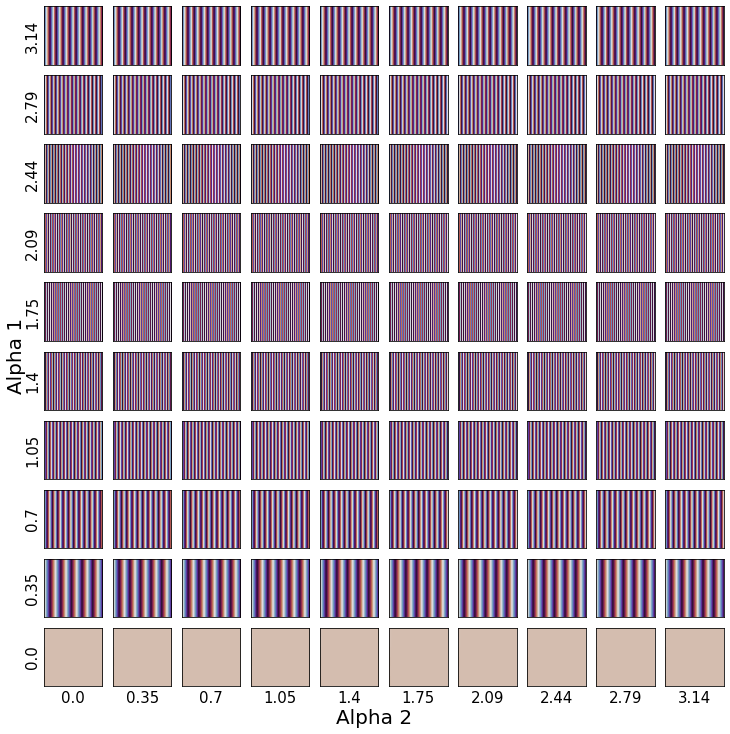

In [15]:
folder = "./results/"

path = folder + "hexagone_flip.pkl"
filename = "hexagone_flip.pdf"
plot_phases(path, filename)

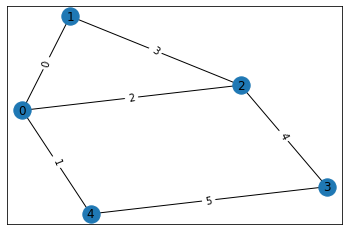

In [28]:
G=nx.Graph()

G.add_edge(0,1,weight=1,edge_com=0)
G.add_edge(1,2,weight=1,edge_com=0)
G.add_edge(2,3,weight=1,edge_com=0)
G.add_edge(3,4,weight=1,edge_com=0)
G.add_edge(4,0,weight=1,edge_com=0)
# G.add_edge(5,0,weight=1,edge_com=0)

G.add_edge(2,0,weight=1,edge_com=0)

node_com_dict=dict(zip(list(np.linspace(0,5,6).astype(int)),[0,0,0,0,0,0]))
nx.set_node_attributes(G, node_com_dict, "node_com")

edge_community_assignment=np.array(list(nx.get_edge_attributes(G,'edge_com').values()))

Gsc=SimplicialComplex(graph=G, no_faces=False)

# plt.figure()
# nx.draw_networkx(G)
# plt.show()
pos = nx.spring_layout(G,)
plt.figure()
nx.draw_networkx_nodes(G, pos=pos)
edge_labels = dict(((u, v), d) for d, (u, v) in enumerate(G.edges))                                                                                                                                                                                                                                         
node_labels = dict((u, d) for d, u in enumerate(G.nodes))                                                                                                                                                                                                                                                   
_=nx.draw_networkx_edge_labels(G, pos=pos, edge_labels=edge_labels)  
_=nx.draw_networkx_labels(G, pos=pos, labels=node_labels)
_=nx.draw_networkx_edges(G,pos=pos)

In [17]:
Gsc.edgelist

[(0, 1), (0, 4), (0, 2), (1, 2), (2, 3), (3, 4)]

In [18]:
alpha1 = np.linspace(0,np.pi, 10)
alpha2 = np.linspace(0, np.pi, 10)
n_repeats = 1

scan_frustration_parameters(
        Gsc,
        filename="house.pkl",
        alpha1=alpha1,
        alpha2=alpha2,
        repeats=n_repeats,
        n_workers=2,
    )

100%|██████████| 100/100 [07:21<00:00,  4.41s/it]


[[  message: 'The solver successfully reached the end of the integration interval.'
       nfev: 576
       njev: 2
        nlu: 42
        sol: None
     status: 0
    success: True
          t: array([  0.        ,   0.1001001 ,   0.2002002 ,   0.3003003 ,
           0.4004004 ,   0.5005005 ,   0.6006006 ,   0.7007007 ,
           0.8008008 ,   0.9009009 ,   1.001001  ,   1.1011011 ,
           1.2012012 ,   1.3013013 ,   1.4014014 ,   1.5015015 ,
           1.6016016 ,   1.7017017 ,   1.8018018 ,   1.9019019 ,
           2.002002  ,   2.1021021 ,   2.2022022 ,   2.3023023 ,
           2.4024024 ,   2.5025025 ,   2.6026026 ,   2.7027027 ,
           2.8028028 ,   2.9029029 ,   3.003003  ,   3.1031031 ,
           3.2032032 ,   3.3033033 ,   3.4034034 ,   3.5035035 ,
           3.6036036 ,   3.7037037 ,   3.8038038 ,   3.9039039 ,
           4.004004  ,   4.1041041 ,   4.2042042 ,   4.3043043 ,
           4.4044044 ,   4.5045045 ,   4.6046046 ,   4.7047047 ,
           4.8048048 ,   4

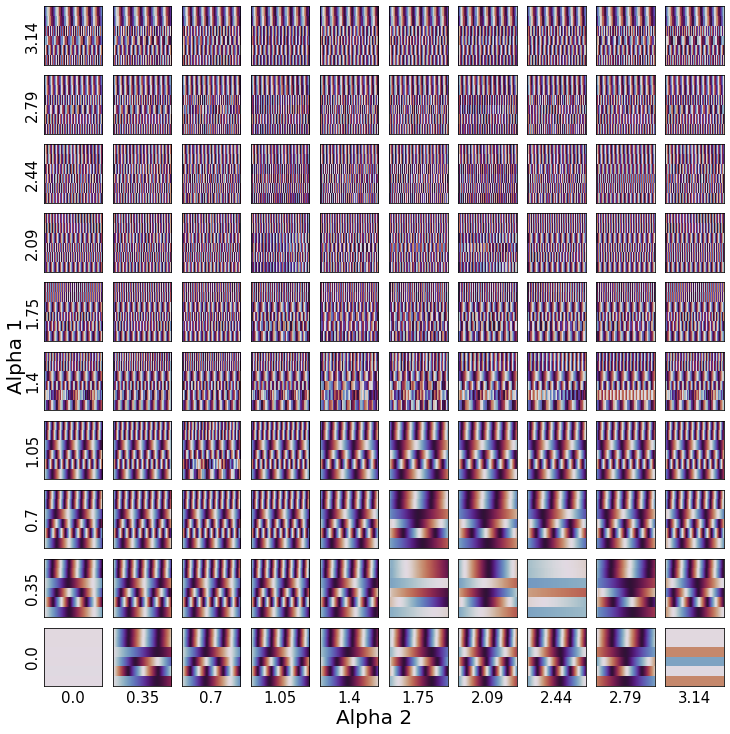

In [21]:
folder = "./results/"

path = folder + "house.pkl"
filename = "house.pdf"
plot_phases(path, filename)

In [31]:
# makes the hole a directed cycle
Gsc.flip_edge_orientation(1)

alpha1 = np.linspace(0,np.pi, 10)
alpha2 = np.linspace(0, np.pi, 10)
n_repeats = 1

scan_frustration_parameters(
        Gsc,
        filename="house_hole_cyle.pkl",
        alpha1=alpha1,
        alpha2=alpha2,
        repeats=n_repeats,
        n_workers=2,
    )

100%|██████████| 100/100 [09:37<00:00,  5.78s/it]


[[  message: 'The solver successfully reached the end of the integration interval.'
       nfev: 540
       njev: 2
        nlu: 39
        sol: None
     status: 0
    success: True
          t: array([  0.        ,   0.1001001 ,   0.2002002 ,   0.3003003 ,
           0.4004004 ,   0.5005005 ,   0.6006006 ,   0.7007007 ,
           0.8008008 ,   0.9009009 ,   1.001001  ,   1.1011011 ,
           1.2012012 ,   1.3013013 ,   1.4014014 ,   1.5015015 ,
           1.6016016 ,   1.7017017 ,   1.8018018 ,   1.9019019 ,
           2.002002  ,   2.1021021 ,   2.2022022 ,   2.3023023 ,
           2.4024024 ,   2.5025025 ,   2.6026026 ,   2.7027027 ,
           2.8028028 ,   2.9029029 ,   3.003003  ,   3.1031031 ,
           3.2032032 ,   3.3033033 ,   3.4034034 ,   3.5035035 ,
           3.6036036 ,   3.7037037 ,   3.8038038 ,   3.9039039 ,
           4.004004  ,   4.1041041 ,   4.2042042 ,   4.3043043 ,
           4.4044044 ,   4.5045045 ,   4.6046046 ,   4.7047047 ,
           4.8048048 ,   4

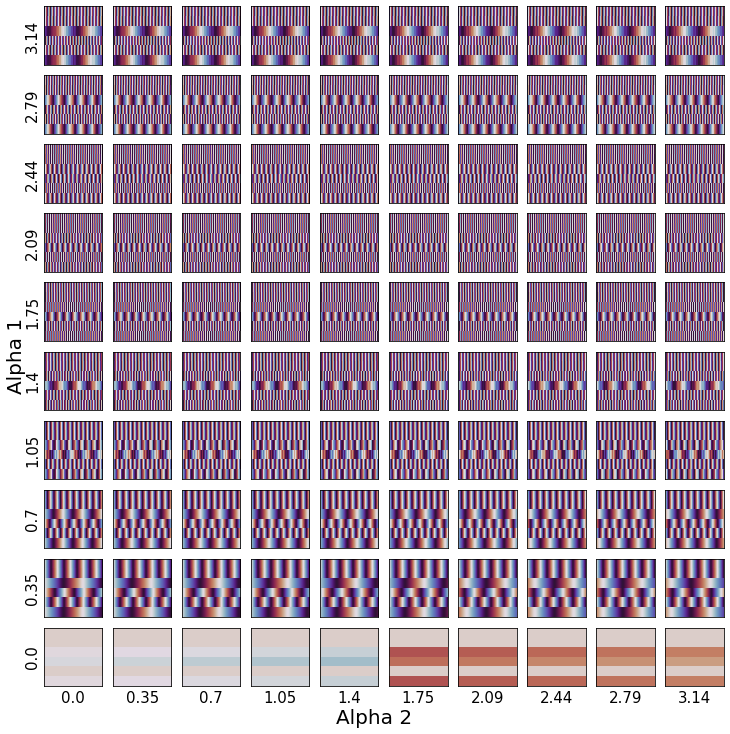

In [32]:
folder = "./results/"

path = folder + "house_hole_cyle.pkl"
filename = "house_hole_cyle.pdf"
plot_phases(path, filename)

In [33]:
# makes the triangle a directed cycle (while keeping the hole a 3/4 directed cycle)
Gsc.flip_edge_orientation(2)

alpha1 = np.linspace(0,np.pi, 10)
alpha2 = np.linspace(0, np.pi, 10)
n_repeats = 1

scan_frustration_parameters(
        Gsc,
        filename="house_triangle_cyle.pkl",
        alpha1=alpha1,
        alpha2=alpha2,
        repeats=n_repeats,
        n_workers=2,
    )

100%|██████████| 100/100 [02:12<00:00,  1.32s/it]


[[  message: 'The solver successfully reached the end of the integration interval.'
       nfev: 508
       njev: 2
        nlu: 37
        sol: None
     status: 0
    success: True
          t: array([  0.        ,   0.1001001 ,   0.2002002 ,   0.3003003 ,
           0.4004004 ,   0.5005005 ,   0.6006006 ,   0.7007007 ,
           0.8008008 ,   0.9009009 ,   1.001001  ,   1.1011011 ,
           1.2012012 ,   1.3013013 ,   1.4014014 ,   1.5015015 ,
           1.6016016 ,   1.7017017 ,   1.8018018 ,   1.9019019 ,
           2.002002  ,   2.1021021 ,   2.2022022 ,   2.3023023 ,
           2.4024024 ,   2.5025025 ,   2.6026026 ,   2.7027027 ,
           2.8028028 ,   2.9029029 ,   3.003003  ,   3.1031031 ,
           3.2032032 ,   3.3033033 ,   3.4034034 ,   3.5035035 ,
           3.6036036 ,   3.7037037 ,   3.8038038 ,   3.9039039 ,
           4.004004  ,   4.1041041 ,   4.2042042 ,   4.3043043 ,
           4.4044044 ,   4.5045045 ,   4.6046046 ,   4.7047047 ,
           4.8048048 ,   4

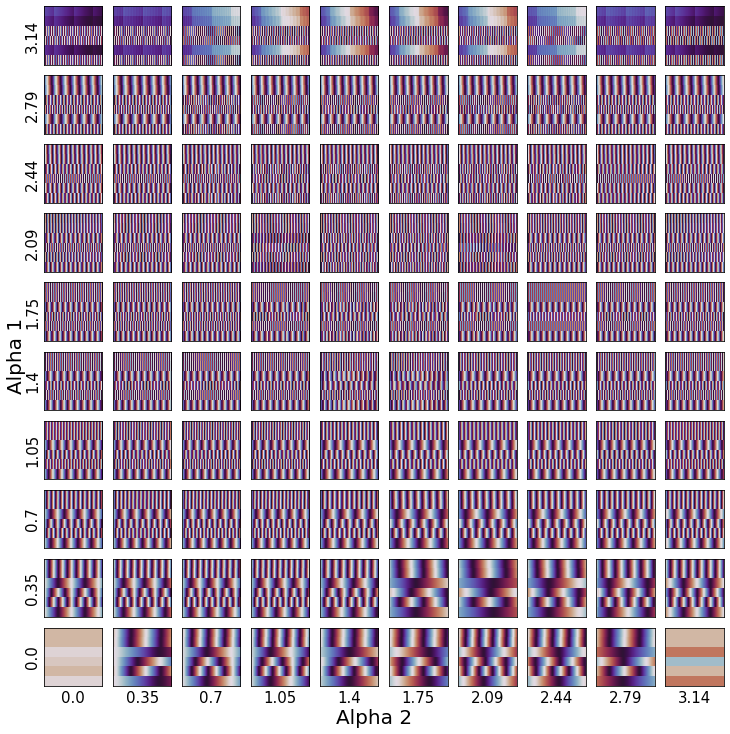

In [34]:
folder = "./results/"

path = folder + "house_triangle_cyle.pkl"
filename = "house_triangle_cyle.pdf"
plot_phases(path, filename)

In [35]:
# makes the triangle a directed cycle (with the original hole 1/2 directed cycle)
Gsc.flip_edge_orientation(1)
Gsc.flip_edge_orientation(2)

alpha1 = np.linspace(0,np.pi, 10)
alpha2 = np.linspace(0, np.pi, 10)
n_repeats = 1

scan_frustration_parameters(
        Gsc,
        filename="house_triangle_cyle_semi_hole.pkl",
        alpha1=alpha1,
        alpha2=alpha2,
        repeats=n_repeats,
        n_workers=2,
    )

100%|██████████| 100/100 [09:28<00:00,  5.68s/it]


[[  message: 'The solver successfully reached the end of the integration interval.'
       nfev: 629
       njev: 2
        nlu: 41
        sol: None
     status: 0
    success: True
          t: array([  0.        ,   0.1001001 ,   0.2002002 ,   0.3003003 ,
           0.4004004 ,   0.5005005 ,   0.6006006 ,   0.7007007 ,
           0.8008008 ,   0.9009009 ,   1.001001  ,   1.1011011 ,
           1.2012012 ,   1.3013013 ,   1.4014014 ,   1.5015015 ,
           1.6016016 ,   1.7017017 ,   1.8018018 ,   1.9019019 ,
           2.002002  ,   2.1021021 ,   2.2022022 ,   2.3023023 ,
           2.4024024 ,   2.5025025 ,   2.6026026 ,   2.7027027 ,
           2.8028028 ,   2.9029029 ,   3.003003  ,   3.1031031 ,
           3.2032032 ,   3.3033033 ,   3.4034034 ,   3.5035035 ,
           3.6036036 ,   3.7037037 ,   3.8038038 ,   3.9039039 ,
           4.004004  ,   4.1041041 ,   4.2042042 ,   4.3043043 ,
           4.4044044 ,   4.5045045 ,   4.6046046 ,   4.7047047 ,
           4.8048048 ,   4

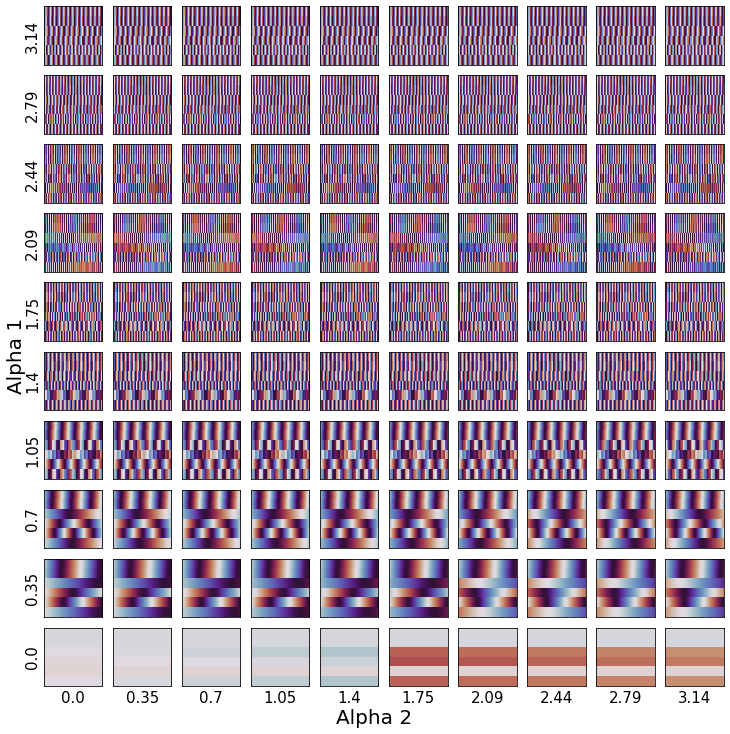

In [36]:
folder = "./results/"

path = folder + "house_triangle_cyle_semi_hole.pkl"
filename = "house_triangle_cyle_semi_hole.pdf"
plot_phases(path, filename)

## Two cliques one hole

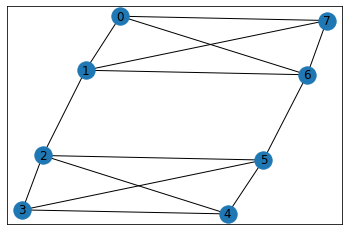

In [98]:
G=nx.Graph()

G.add_edge(0,1,weight=1,edge_com=0)
G.add_edge(6,7,weight=1,edge_com=0)
G.add_edge(7,0,weight=1,edge_com=0)
G.add_edge(0,6,weight=1,edge_com=0)
G.add_edge(1,7,weight=1,edge_com=0)

G.add_edge(1,6,weight=1,edge_com=2)

G.add_edge(2,3,weight=1,edge_com=1)
G.add_edge(3,4,weight=1,edge_com=1)
G.add_edge(4,5,weight=1,edge_com=1)
G.add_edge(2,4,weight=1,edge_com=1)
G.add_edge(3,5,weight=1,edge_com=1)

G.add_edge(2,5,weight=1,edge_com=2)

G.add_edge(1,2,weight=1,edge_com=2)
G.add_edge(5,6,weight=1,edge_com=2)

node_com_dict=dict(zip(list(np.linspace(0,7,8).astype(int)),[0,0,1,1,1,1,0,0]))
nx.set_node_attributes(G, node_com_dict, "node_com")

edge_community_assignment=np.array(list(nx.get_edge_attributes(G,'edge_com').values()))



Gsc=SimplicialComplex(graph=G, no_faces=False)

plt.figure()
nx.draw_networkx(G)
plt.show()